In [21]:
# Imports
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
from collections import Counter
from tqdm.auto import tqdm
import warnings
warnings.filterwarnings('ignore')

# Plotting settings
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette('husl')
%matplotlib inline

# Set figure quality
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 150

In [22]:
# Configuration
DATA_DIR = 'data'  # Adjust this path!

PATHS = {
    'train_csv': f'{DATA_DIR}/train_metadata.csv',
    'val_csv': f'{DATA_DIR}/val_metadata.csv',
    'train_images': f'{DATA_DIR}/train_images',
    'val_images': f'{DATA_DIR}/val_images',
    'test_images': f'{DATA_DIR}/test_images',
    'sample_submission': f'{DATA_DIR}/sample_submission.csv',
}

# Class mapping
CLASS_NAMES = {
    0: 'Groove_billed_Ani',
    1: 'Red_winged_Blackbird',
    2: 'Rusty_Blackbird',
    3: 'Gray_Catbird',
    4: 'Brandt_Cormorant',
    5: 'Eastern_Towhee',
    6: 'Indigo_Bunting',
    7: 'Brewer_Blackbird',
    8: 'Painted_Bunting',
    9: 'Bobolink',
    10: 'Lazuli_Bunting',
    11: 'Yellow_headed_Blackbird',
    12: 'American_Crow',
    13: 'Fish_Crow',
    14: 'Brown_Creeper',
    15: 'Yellow_billed_Cuckoo',
    16: 'Yellow_breasted_Chat',
    17: 'Black_billed_Cuckoo',
    18: 'Gray_crowned_Rosy_Finch',
    19: 'Bronzed_Cowbird'
}

NUM_CLASSES = 20

print(f'Data directory: {DATA_DIR}')
print(f'Number of classes: {NUM_CLASSES}')

Data directory: data
Number of classes: 20


In [23]:
# Load metadata
train_df = pd.read_csv(PATHS['train_csv'])
val_df = pd.read_csv(PATHS['val_csv'])
sample_submission = pd.read_csv(PATHS['sample_submission'])

print('✓ Data loaded successfully!\n')
print(f"Training samples: {len(train_df):,}")
print(f"Validation samples: {len(val_df):,}")
print(f"Test samples: {len(sample_submission):,}")
print(f"Total samples: {len(train_df) + len(val_df) + len(sample_submission):,}")

✓ Data loaded successfully!

Training samples: 1,082
Validation samples: 103
Test samples: 400
Total samples: 1,585


## Dataset Overview <a id='overview'></a>

In [24]:
# Display first few rows
print('Training Data Sample:')
display(train_df.head(10))

print('\nValidation Data Sample:')
display(val_df.head(10))

Training Data Sample:


,path,class,class_idx
0,Brandt_Cormorant/Brandt_Cormorant_0071_23007.jpg,Brandt_Cormorant,4
1,Brandt_Cormorant/Brandt_Cormorant_0028_22892.jpg,Brandt_Cormorant,4
2,Brandt_Cormorant/Brandt_Cormorant_0076_23021.jpg,Brandt_Cormorant,4
3,Brandt_Cormorant/Brandt_Cormorant_0080_23002.jpg,Brandt_Cormorant,4
4,Brandt_Cormorant/Brandt_Cormorant_0045_22916.jpg,Brandt_Cormorant,4
5,Brandt_Cormorant/Brandt_Cormorant_0018_23090.jpg,Brandt_Cormorant,4
6,Brandt_Cormorant/Brandt_Cormorant_0035_23000.jpg,Brandt_Cormorant,4
7,Brandt_Cormorant/Brandt_Cormorant_0044_22884.jpg,Brandt_Cormorant,4
8,Brandt_Cormorant/Brandt_Cormorant_0072_23069.jpg,Brandt_Cormorant,4
9,Brandt_Cormorant/Brandt_Cormorant_0064_22849.jpg,Brandt_Cormorant,4



Validation Data Sample:


,path,class,class_idx
0,Brandt_Cormorant/Brandt_Cormorant_0092_23061.jpg,Brandt_Cormorant,4
1,Brandt_Cormorant/Brandt_Cormorant_0047_23337.jpg,Brandt_Cormorant,4
2,Brandt_Cormorant/Brandt_Cormorant_0083_23156.jpg,Brandt_Cormorant,4
3,Brandt_Cormorant/Brandt_Cormorant_0070_23137.jpg,Brandt_Cormorant,4
4,Brandt_Cormorant/Brandt_Cormorant_0009_22890.jpg,Brandt_Cormorant,4
5,Brandt_Cormorant/Brandt_Cormorant_0039_22945.jpg,Brandt_Cormorant,4
6,Brown_Creeper/Brown_Creeper_0089_24841.jpg,Brown_Creeper,14
7,Brown_Creeper/Brown_Creeper_0059_25010.jpg,Brown_Creeper,14
8,Brown_Creeper/Brown_Creeper_0113_24560.jpg,Brown_Creeper,14
9,Brown_Creeper/Brown_Creeper_0035_24941.jpg,Brown_Creeper,14


In [25]:
# Data info
print('Training Data Info:')
print(train_df.info())

print('\nBasic Statistics:')
print(train_df.describe())

print('\nMissing Values:')
print(train_df.isnull().sum())

Training Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1082 entries, 0 to 1081
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   path       1082 non-null   object
 1   class      1082 non-null   object
 2   class_idx  1082 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 25.5+ KB
None

Basic Statistics:
         class_idx
count  1082.000000
mean      9.388170
std       5.761123
min       0.000000
25%       4.000000
50%       9.000000
75%      14.000000
max      19.000000

Missing Values:
path         0
class        0
class_idx    0
dtype: int64


## Class Distribution Analysis <a id='distribution'></a>

In [26]:
# Count samples per class
train_class_counts = train_df['class_idx'].value_counts().sort_index()
val_class_counts = val_df['class_idx'].value_counts().sort_index()

# Create distribution dataframe
distribution_df = pd.DataFrame({
    'Class': [CLASS_NAMES[i].replace('_', ' ') for i in range(NUM_CLASSES)],
    'Train Count': [train_class_counts.get(i, 0) for i in range(NUM_CLASSES)],
    'Val Count': [val_class_counts.get(i, 0) for i in range(NUM_CLASSES)],
})

distribution_df['Total'] = distribution_df['Train Count'] + distribution_df['Val Count']
distribution_df['Train %'] = (distribution_df['Train Count'] / distribution_df['Train Count'].sum() * 100).round(2)
distribution_df['Val %'] = (distribution_df['Val Count'] / distribution_df['Val Count'].sum() * 100).round(2)

print('Class Distribution:\n')
display(distribution_df)

# Save to file
distribution_df.to_csv('data_analysis/class_distribution.csv', index=False)

Class Distribution:



,Class,Train Count,Val Count,Total,Train %,Val %
0,Groove billed Ani,58,2,60,5.36,1.94
1,Red winged Blackbird,53,7,60,4.90,6.80
2,Rusty Blackbird,57,3,60,5.27,2.91
3,Gray Catbird,54,5,59,4.99,4.85
4,Brandt Cormorant,53,6,59,4.90,5.83
5,Eastern Towhee,54,6,60,4.99,5.83
6,Indigo Bunting,57,3,60,5.27,2.91
7,Brewer Blackbird,55,4,59,5.08,3.88
8,Painted Bunting,52,6,58,4.81,5.83
9,Bobolink,58,2,60,5.36,1.94


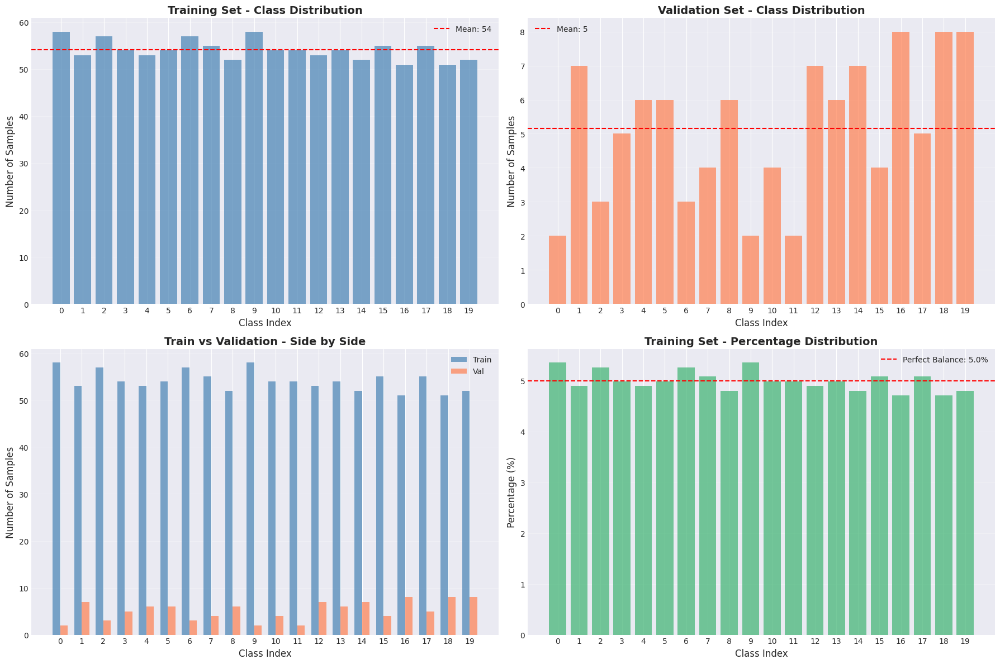

In [27]:
# Plot class distribution
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Training distribution
axes[0, 0].bar(range(NUM_CLASSES), train_class_counts.values, color='steelblue', alpha=0.7)
axes[0, 0].set_xlabel('Class Index', fontsize=12)
axes[0, 0].set_ylabel('Number of Samples', fontsize=12)
axes[0, 0].set_title('Training Set - Class Distribution', fontsize=14, fontweight='bold')
axes[0, 0].set_xticks(range(NUM_CLASSES))
axes[0, 0].grid(axis='y', alpha=0.3)
axes[0, 0].axhline(train_class_counts.mean(), color='red', linestyle='--', label=f'Mean: {train_class_counts.mean():.0f}')
axes[0, 0].legend()

# Validation distribution
axes[0, 1].bar(range(NUM_CLASSES), val_class_counts.values, color='coral', alpha=0.7)
axes[0, 1].set_xlabel('Class Index', fontsize=12)
axes[0, 1].set_ylabel('Number of Samples', fontsize=12)
axes[0, 1].set_title('Validation Set - Class Distribution', fontsize=14, fontweight='bold')
axes[0, 1].set_xticks(range(NUM_CLASSES))
axes[0, 1].grid(axis='y', alpha=0.3)
axes[0, 1].axhline(val_class_counts.mean(), color='red', linestyle='--', label=f'Mean: {val_class_counts.mean():.0f}')
axes[0, 1].legend()

# Combined distribution
x = np.arange(NUM_CLASSES)
width = 0.35
axes[1, 0].bar(x - width/2, train_class_counts.values, width, label='Train', color='steelblue', alpha=0.7)
axes[1, 0].bar(x + width/2, val_class_counts.values, width, label='Val', color='coral', alpha=0.7)
axes[1, 0].set_xlabel('Class Index', fontsize=12)
axes[1, 0].set_ylabel('Number of Samples', fontsize=12)
axes[1, 0].set_title('Train vs Validation - Side by Side', fontsize=14, fontweight='bold')
axes[1, 0].set_xticks(range(NUM_CLASSES))
axes[1, 0].legend()
axes[1, 0].grid(axis='y', alpha=0.3)

# Percentage distribution
percentages = (train_class_counts / train_class_counts.sum() * 100).values
axes[1, 1].bar(range(NUM_CLASSES), percentages, color='mediumseagreen', alpha=0.7)
axes[1, 1].set_xlabel('Class Index', fontsize=12)
axes[1, 1].set_ylabel('Percentage (%)', fontsize=12)
axes[1, 1].set_title('Training Set - Percentage Distribution', fontsize=14, fontweight='bold')
axes[1, 1].set_xticks(range(NUM_CLASSES))
axes[1, 1].axhline(100/NUM_CLASSES, color='red', linestyle='--', label=f'Perfect Balance: {100/NUM_CLASSES:.1f}%')
axes[1, 1].grid(axis='y', alpha=0.3)
axes[1, 1].legend()

plt.tight_layout()
plt.savefig('data_analysis/class_distribution_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

In [40]:
# Class imbalance analysis
print('Class Imbalance Analysis:\n')
print(f"Most common class: {CLASS_NAMES[train_class_counts.idxmax()]} ({train_class_counts.max()} samples)")
print(f"Least common class: {CLASS_NAMES[train_class_counts.idxmin()]} ({train_class_counts.min()} samples)")
print(f"Mean samples per class: {train_class_counts.mean():.1f}")
print(f"Std dev: {train_class_counts.std():.1f}")

imbalance_ratio = train_class_counts.max() / train_class_counts.min()
print(f"\nImbalance Ratio: {imbalance_ratio:.2f}")

if imbalance_ratio > 3:
    print('Severe class imbalance detected')
elif imbalance_ratio > 2:
    print('Moderate class imbalance detected')
else:
    print('Classes are relatively balanced')

Class Imbalance Analysis:

Most common class: Groove_billed_Ani (58 samples)
Least common class: Yellow_breasted_Chat (51 samples)
Mean samples per class: 54.1
Std dev: 2.1

Imbalance Ratio: 1.14
Classes are relatively balanced


Recommended Class Weights for Loss Function:



,Class,Count,Weight
0,Groove billed Ani,58,0.932759
1,Red winged Blackbird,53,1.020755
2,Rusty Blackbird,57,0.949123
3,Gray Catbird,54,1.001852
4,Brandt Cormorant,53,1.020755
5,Eastern Towhee,54,1.001852
6,Indigo Bunting,57,0.949123
7,Brewer Blackbird,55,0.983636
8,Painted Bunting,52,1.040385
9,Bobolink,58,0.932759


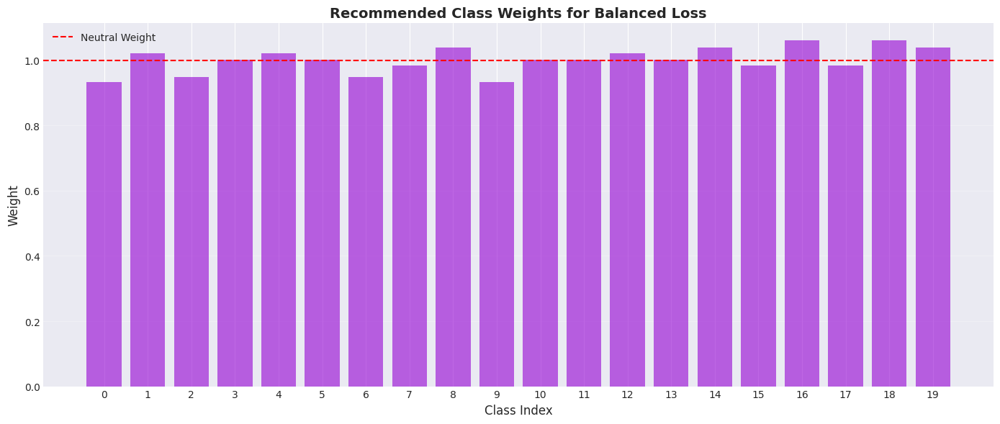

In [29]:
# Calculate class weights for balanced training
class_weights = len(train_df) / (NUM_CLASSES * train_class_counts.values)

weights_df = pd.DataFrame({
    'Class': [CLASS_NAMES[i].replace('_', ' ') for i in range(NUM_CLASSES)],
    'Count': train_class_counts.values,
    'Weight': class_weights
})

print('Recommended Class Weights for Loss Function:\n')
display(weights_df)

# Visualize weights
plt.figure(figsize=(14, 6))
plt.bar(range(NUM_CLASSES), class_weights, color='darkviolet', alpha=0.6)
plt.xlabel('Class Index', fontsize=12)
plt.ylabel('Weight', fontsize=12)
plt.title('Recommended Class Weights for Balanced Loss', fontsize=14, fontweight='bold')
plt.axhline(1.0, color='red', linestyle='--', label='Neutral Weight')
plt.xticks(range(NUM_CLASSES))
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig('data_analysis/class_weights.png', dpi=150, bbox_inches='tight')
plt.show()

# Save weights
weights_df.to_csv('data_analysis/class_weights.csv', index=False)

## Image Characteristics Analysis <a id='image-analysis'></a>

In [30]:
# Analyze image dimensions and properties
def analyze_images(df, image_dir, n_samples=500, desc='Analyzing images'):
    """Analyze image characteristics"""
    
    widths = []
    heights = []
    aspect_ratios = []
    file_sizes = []
    channels = []
    
    # Sample images for analysis
    sample_df = df.sample(min(n_samples, len(df)), random_state=42)
    
    for _, row in tqdm(sample_df.iterrows(), total=len(sample_df), desc=desc):
        try:
            img_path = os.path.join(image_dir, row['path'])
            
            # Get file size
            file_sizes.append(os.path.getsize(img_path) / 1024)  # KB
            
            # Load image
            img = Image.open(img_path)
            w, h = img.size
            
            widths.append(w)
            heights.append(h)
            aspect_ratios.append(w / h)
            
            # Check channels
            img_array = np.array(img)
            if len(img_array.shape) == 3:
                channels.append(img_array.shape[2])
            else:
                channels.append(1)
                
        except Exception as e:
            print(f"Error processing {row['path']}: {e}")
    
    return {
        'widths': widths,
        'heights': heights,
        'aspect_ratios': aspect_ratios,
        'file_sizes': file_sizes,
        'channels': channels
    }

# Analyze training images
print('Analyzing training images...')
train_stats = analyze_images(train_df, PATHS['train_images'], n_samples=500)

print('\nAnalyzing validation images...')
val_stats = analyze_images(val_df, PATHS['val_images'], n_samples=min(200, len(val_df)))

Analyzing training images...


Analyzing images:   0%|          | 0/500 [00:00<?, ?it/s]


Analyzing validation images...


Analyzing images:   0%|          | 0/103 [00:00<?, ?it/s]

In [41]:
# Image statistics summary
def print_image_stats(stats, dataset_name):
    print(f'\n{"="*60}')
    print(f'{dataset_name} Image Statistics')
    print(f'{"="*60}')
    
    print(f"\nDimensions:")
    print(f"  Width  - Mean: {np.mean(stats['widths']):.1f}, Std: {np.std(stats['widths']):.1f}")
    print(f"         - Min: {np.min(stats['widths']):.0f}, Max: {np.max(stats['widths']):.0f}")
    print(f"  Height - Mean: {np.mean(stats['heights']):.1f}, Std: {np.std(stats['heights']):.1f}")
    print(f"         - Min: {np.min(stats['heights']):.0f}, Max: {np.max(stats['heights']):.0f}")
    
    print(f"\nAspect Ratio:")
    print(f"  Mean: {np.mean(stats['aspect_ratios']):.2f}")
    print(f"  Min: {np.min(stats['aspect_ratios']):.2f}, Max: {np.max(stats['aspect_ratios']):.2f}")
    
    print(f"\nFile Size (KB):")
    print(f"  Mean: {np.mean(stats['file_sizes']):.1f}")
    print(f"  Min: {np.min(stats['file_sizes']):.1f}, Max: {np.max(stats['file_sizes']):.1f}")
    
    print(f"\nChannels:")
    channel_counts = Counter(stats['channels'])
    for c, count in channel_counts.items():
        print(f"  {c} channels: {count} images ({count/len(stats['channels'])*100:.1f}%)")

print_image_stats(train_stats, 'TRAINING SET')


TRAINING SET Image Statistics

Dimensions:
  Width  - Mean: 468.2, Std: 60.7
         - Min: 170, Max: 500
  Height - Mean: 396.5, Std: 71.0
         - Min: 137, Max: 500

Aspect Ratio:
  Mean: 1.23
  Min: 0.38, Max: 2.07

File Size (KB):
  Mean: 106.5
  Min: 4.4, Max: 319.6

Channels:
  3 channels: 500 images (100.0%)


In [42]:
print_image_stats(val_stats, 'VALIDATION SET')


VALIDATION SET Image Statistics

Dimensions:
  Width  - Mean: 458.5, Std: 71.7
         - Min: 167, Max: 500
  Height - Mean: 402.2, Std: 71.5
         - Min: 200, Max: 500

Aspect Ratio:
  Mean: 1.18
  Min: 0.63, Max: 1.67

File Size (KB):
  Mean: 103.7
  Min: 32.6, Max: 222.2

Channels:
  3 channels: 103 images (100.0%)


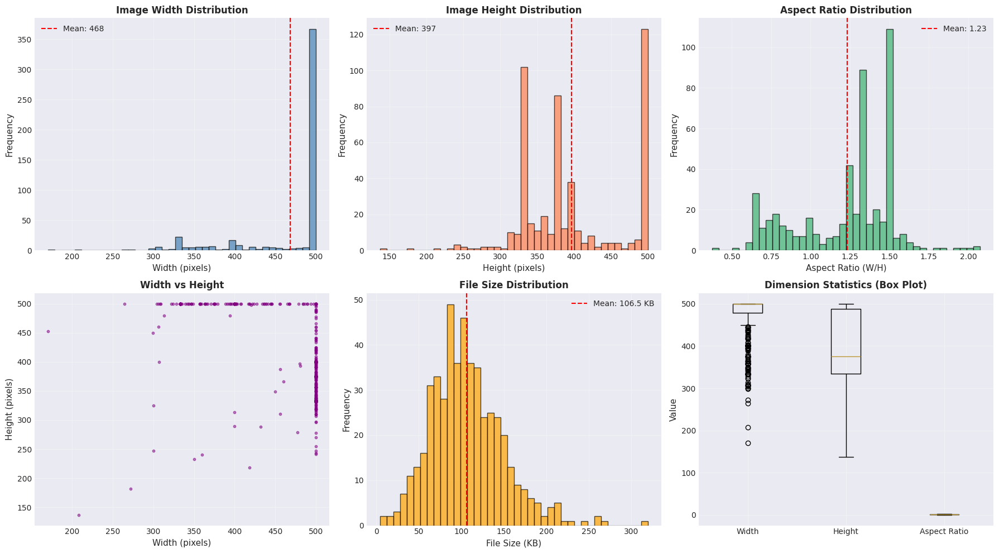

In [32]:
# Plot image characteristics
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Width distribution
axes[0, 0].hist(train_stats['widths'], bins=40, color='steelblue', alpha=0.7, edgecolor='black')
axes[0, 0].axvline(np.mean(train_stats['widths']), color='red', linestyle='--', 
                   label=f"Mean: {np.mean(train_stats['widths']):.0f}")
axes[0, 0].set_xlabel('Width (pixels)', fontsize=11)
axes[0, 0].set_ylabel('Frequency', fontsize=11)
axes[0, 0].set_title('Image Width Distribution', fontsize=12, fontweight='bold')
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# Height distribution
axes[0, 1].hist(train_stats['heights'], bins=40, color='coral', alpha=0.7, edgecolor='black')
axes[0, 1].axvline(np.mean(train_stats['heights']), color='red', linestyle='--',
                   label=f"Mean: {np.mean(train_stats['heights']):.0f}")
axes[0, 1].set_xlabel('Height (pixels)', fontsize=11)
axes[0, 1].set_ylabel('Frequency', fontsize=11)
axes[0, 1].set_title('Image Height Distribution', fontsize=12, fontweight='bold')
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

# Aspect ratio
axes[0, 2].hist(train_stats['aspect_ratios'], bins=40, color='mediumseagreen', alpha=0.7, edgecolor='black')
axes[0, 2].axvline(np.mean(train_stats['aspect_ratios']), color='red', linestyle='--',
                   label=f"Mean: {np.mean(train_stats['aspect_ratios']):.2f}")
axes[0, 2].set_xlabel('Aspect Ratio (W/H)', fontsize=11)
axes[0, 2].set_ylabel('Frequency', fontsize=11)
axes[0, 2].set_title('Aspect Ratio Distribution', fontsize=12, fontweight='bold')
axes[0, 2].legend()
axes[0, 2].grid(alpha=0.3)

# Width vs Height scatter
axes[1, 0].scatter(train_stats['widths'], train_stats['heights'], alpha=0.5, s=10, color='purple')
axes[1, 0].set_xlabel('Width (pixels)', fontsize=11)
axes[1, 0].set_ylabel('Height (pixels)', fontsize=11)
axes[1, 0].set_title('Width vs Height', fontsize=12, fontweight='bold')
axes[1, 0].grid(alpha=0.3)

# File size distribution
axes[1, 1].hist(train_stats['file_sizes'], bins=40, color='orange', alpha=0.7, edgecolor='black')
axes[1, 1].axvline(np.mean(train_stats['file_sizes']), color='red', linestyle='--',
                   label=f"Mean: {np.mean(train_stats['file_sizes']):.1f} KB")
axes[1, 1].set_xlabel('File Size (KB)', fontsize=11)
axes[1, 1].set_ylabel('Frequency', fontsize=11)
axes[1, 1].set_title('File Size Distribution', fontsize=12, fontweight='bold')
axes[1, 1].legend()
axes[1, 1].grid(alpha=0.3)

# Box plot comparison
data_to_plot = [
    train_stats['widths'],
    train_stats['heights'],
    [w/h for w, h in zip(train_stats['widths'], train_stats['heights'])]
]
axes[1, 2].boxplot(data_to_plot, labels=['Width', 'Height', 'Aspect Ratio'])
axes[1, 2].set_ylabel('Value', fontsize=11)
axes[1, 2].set_title('Dimension Statistics (Box Plot)', fontsize=12, fontweight='bold')
axes[1, 2].grid(alpha=0.3)

plt.tight_layout()
plt.savefig('data_analysis/image_characteristics.png', dpi=150, bbox_inches='tight')
plt.show()

In [33]:
# Recommendations based on image analysis
print('\n📊 RECOMMENDATIONS FOR IMAGE PREPROCESSING:\n')

avg_width = np.mean(train_stats['widths'])
avg_height = np.mean(train_stats['heights'])
avg_aspect = np.mean(train_stats['aspect_ratios'])

print(f"Average image size: {avg_width:.0f} x {avg_height:.0f}")
print(f"Average aspect ratio: {avg_aspect:.2f}\n")

# Suggest input sizes
if avg_width < 300 and avg_height < 300:
    print('Recommended input sizes: 224x224, 256x256')
elif avg_width < 500 and avg_height < 500:
    print('Recommended input sizes: 224x224, 384x384')
else:
    print('Recommended input sizes: 384x384, 448x448')

# Check aspect ratio variance
aspect_std = np.std(train_stats['aspect_ratios'])
if aspect_std > 0.3:
    print('\n⚠️ High aspect ratio variance detected')
    print('   → Use center crop or padding to preserve content')
else:
    print('\n✓ Consistent aspect ratios')
    print('   → Standard resizing should work well')


📊 RECOMMENDATIONS FOR IMAGE PREPROCESSING:

Average image size: 468 x 397
Average aspect ratio: 1.23

Recommended input sizes: 224x224, 384x384

⚠️ High aspect ratio variance detected
   → Use center crop or padding to preserve content


## Visual Exploration <a id='visual'></a>

Generating sample visualizations...


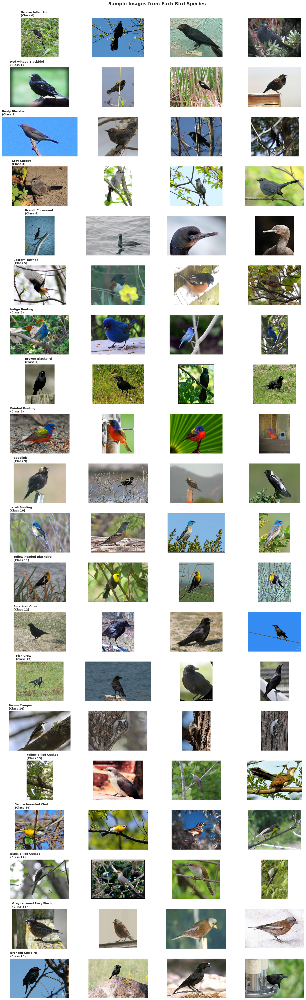

In [34]:
# Display sample images from each class
def visualize_class_samples(df, image_dir, n_samples=4):
    """Show sample images from each class"""
    
    fig, axes = plt.subplots(NUM_CLASSES, n_samples, figsize=(16, 50))
    
    for class_idx in range(NUM_CLASSES):
        class_samples = df[df['class_idx'] == class_idx]
        
        if len(class_samples) == 0:
            continue
            
        samples = class_samples.sample(min(n_samples, len(class_samples)), random_state=42)
        
        for i, (_, row) in enumerate(samples.iterrows()):
            if i >= n_samples:
                break
                
            img_path = os.path.join(image_dir, row['path'])
            img = Image.open(img_path).convert('RGB')
            
            axes[class_idx, i].imshow(img)
            axes[class_idx, i].axis('off')
            
            if i == 0:
                class_name = CLASS_NAMES[class_idx].replace('_', ' ')
                axes[class_idx, i].set_title(
                    f"{class_name}\n(Class {class_idx})",
                    fontsize=10, loc='left', fontweight='bold'
                )
    
    plt.suptitle('Sample Images from Each Bird Species', fontsize=16, fontweight='bold', y=0.999)
    plt.tight_layout()
    plt.savefig('data_analysis/class_samples.png', dpi=150, bbox_inches='tight')
    plt.show()
    
print('Generating sample visualizations...')
visualize_class_samples(train_df, PATHS['train_images'], n_samples=4)

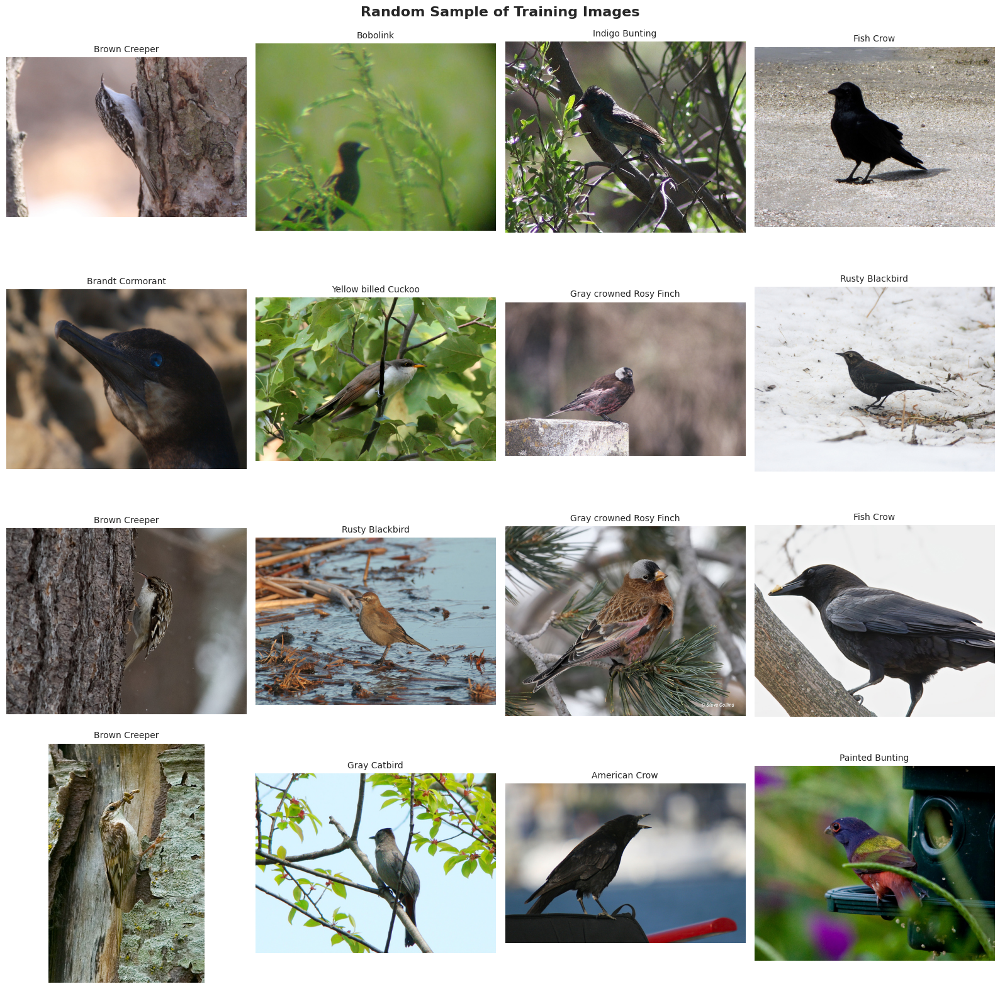

In [35]:
# Visualize random samples in a grid
def show_random_grid(df, image_dir, n_images=16):
    """Show a grid of random images"""
    
    samples = df.sample(n_images, random_state=42)
    
    fig, axes = plt.subplots(4, 4, figsize=(16, 16))
    axes = axes.ravel()
    
    for idx, (_, row) in enumerate(samples.iterrows()):
        img_path = os.path.join(image_dir, row['path'])
        img = Image.open(img_path).convert('RGB')
        
        axes[idx].imshow(img)
        axes[idx].axis('off')
        
        class_name = CLASS_NAMES[row['class_idx']].replace('_', ' ')
        axes[idx].set_title(f"{class_name}", fontsize=10)
    
    plt.suptitle('Random Sample of Training Images', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.savefig('data_analysis/random_samples.png', dpi=150, bbox_inches='tight')
    plt.show()
    
show_random_grid(train_df, PATHS['train_images'])

Analyzing color distribution...


Analyzing colors:   0%|          | 0/200 [00:00<?, ?it/s]

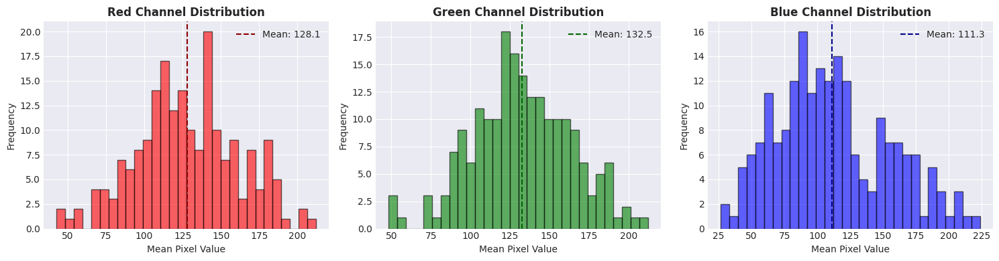


Mean RGB values: (128.1, 132.5, 111.3)


In [36]:
# Analyze color distribution
def analyze_colors(df, image_dir, n_samples=200):
    """Analyze average color distribution"""
    
    mean_colors = {'R': [], 'G': [], 'B': []}
    
    samples = df.sample(min(n_samples, len(df)), random_state=42)
    
    for _, row in tqdm(samples.iterrows(), total=len(samples), desc='Analyzing colors'):
        img_path = os.path.join(image_dir, row['path'])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        mean_colors['R'].append(np.mean(img[:, :, 0]))
        mean_colors['G'].append(np.mean(img[:, :, 1]))
        mean_colors['B'].append(np.mean(img[:, :, 2]))
    
    return mean_colors

print('Analyzing color distribution...')
colors = analyze_colors(train_df, PATHS['train_images'])

# Plot color distribution
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].hist(colors['R'], bins=30, color='red', alpha=0.6, edgecolor='black')
axes[0].set_title('Red Channel Distribution', fontweight='bold')
axes[0].set_xlabel('Mean Pixel Value')
axes[0].set_ylabel('Frequency')
axes[0].axvline(np.mean(colors['R']), color='darkred', linestyle='--', label=f"Mean: {np.mean(colors['R']):.1f}")
axes[0].legend()

axes[1].hist(colors['G'], bins=30, color='green', alpha=0.6, edgecolor='black')
axes[1].set_title('Green Channel Distribution', fontweight='bold')
axes[1].set_xlabel('Mean Pixel Value')
axes[1].set_ylabel('Frequency')
axes[1].axvline(np.mean(colors['G']), color='darkgreen', linestyle='--', label=f"Mean: {np.mean(colors['G']):.1f}")
axes[1].legend()

axes[2].hist(colors['B'], bins=30, color='blue', alpha=0.6, edgecolor='black')
axes[2].set_title('Blue Channel Distribution', fontweight='bold')
axes[2].set_xlabel('Mean Pixel Value')
axes[2].set_ylabel('Frequency')
axes[2].axvline(np.mean(colors['B']), color='darkblue', linestyle='--', label=f"Mean: {np.mean(colors['B']):.1f}")
axes[2].legend()

plt.tight_layout()
plt.savefig('data_analysis/color_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nMean RGB values: ({np.mean(colors['R']):.1f}, {np.mean(colors['G']):.1f}, {np.mean(colors['B']):.1f})")

## Data Quality Assessment <a id='quality'></a>

In [37]:
# Check for corrupted or problematic images
def check_image_quality(df, image_dir):
    """Check for corrupted or problematic images"""
    
    corrupted = []
    grayscale = []
    very_small = []
    very_large = []
    
    for idx, row in tqdm(df.iterrows(), total=len(df), desc='Checking image quality'):
        try:
            img_path = os.path.join(image_dir, row['path'])
            
            # Try to open
            img = Image.open(img_path)
            w, h = img.size
            
            # Check if grayscale
            img_array = np.array(img)
            if len(img_array.shape) == 2:
                grayscale.append(row['path'])
            
            # Check size
            if w < 100 or h < 100:
                very_small.append((row['path'], w, h))
            if w > 3000 or h > 3000:
                very_large.append((row['path'], w, h))
                
        except Exception as e:
            corrupted.append((row['path'], str(e)))
    
    return {
        'corrupted': corrupted,
        'grayscale': grayscale,
        'very_small': very_small,
        'very_large': very_large
    }

print('Checking training image quality...')
quality_report = check_image_quality(train_df, PATHS['train_images'])

print('\n' + '='*60)
print('DATA QUALITY REPORT')
print('='*60)

print(f"\nCorrupted images: {len(quality_report['corrupted'])}")
if quality_report['corrupted']:
    print('⚠️ Found corrupted images:')
    for path, error in quality_report['corrupted'][:5]:
        print(f"   - {path}: {error}")

print(f"\nGrayscale images: {len(quality_report['grayscale'])}")
if quality_report['grayscale']:
    print('⚠️ Grayscale images detected (should convert to RGB)')

print(f"\nVery small images (<100px): {len(quality_report['very_small'])}")
if quality_report['very_small']:
    print('⚠️ Small images found:')
    for path, w, h in quality_report['very_small'][:5]:
        print(f"   - {path}: {w}x{h}")

print(f"\nVery large images (>3000px): {len(quality_report['very_large'])}")

if (len(quality_report['corrupted']) == 0 and 
    len(quality_report['grayscale']) == 0 and 
    len(quality_report['very_small']) == 0):
    print('\n✓ No major quality issues detected!')
else:
    print('\n⚠️ Some quality issues detected - review before training')

Checking training image quality...


Checking image quality:   0%|          | 0/1082 [00:00<?, ?it/s]


DATA QUALITY REPORT

Corrupted images: 0

Grayscale images: 1
⚠️ Grayscale images detected (should convert to RGB)

Very small images (<100px): 0

Very large images (>3000px): 0

⚠️ Some quality issues detected - review before training
